<a href="https://colab.research.google.com/github/craigm-c/Segmentation_and_object_detection_apoferritin/blob/main/Segmentation_and_object_detection_apoferritin_yolov8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Summary

This notebook builds and trains a UNET architecture to segment apoferritin protein complexes in Cryo-EM data and then trains and applies a Yolov8 (from Ultralytics) object detection model to the segmented data to identify instances of the apoferritin protein complex in segmented cryo-EM data for single particle reconstruction.

The UNET is built using Keras and is trained on 151 labelled cryo-EM images and then applied to 10 test images. Significant amounts of time went into optimising hyperparameters for this model which is not shown here to keep the  notebook as concise as possible. These segmented test images were labelled for object detection and used to train a 'yolov8m.pt' model. After extensive hyperparameter tuning a model was trained with mAP50 of 0.995000 and mAP75 of 0.984065, which is a significant improvement over a previous object detection model trained on unsegmeneted data which had an mAP50 of 0.961 and mAP75 of 0.925 highlighting the advantage of using segmented data to detect instances of protein complexes in cryo-EM data.

10 more images were selected and object detection on the segmented and unsegmented data with the respective object detection models are presented to highlight the improvement in preformance using the segmented data.




.

#Segmentation

# Import data and modules



In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!cp -r /content/drive/MyDrive/segment_and_object_detect_apo/apo_segment_train .
!cp -r /content/drive/MyDrive/segment_and_object_detect_apo/apo_segment_test .

In [3]:
import tensorflow as tf
import os
import random
import numpy as np

from tqdm import tqdm
from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt

# Set dimensions for images input into the UNET

I also set the paths to th test and train data as well as extract the image id's to prepare the data in the next section

In [4]:
IMG_WIDTH = 512
IMG_HEIGHT = 512
IMG_CHANNELS = 3

In [5]:
TRAIN_PATH = 'apo_segment_train/'
TEST_PATH = 'apo_segment_test/'

In [6]:
train_ids = []
test_ids = []

count = 0
for filename in os.listdir(TRAIN_PATH + 'images/'):
    if filename.endswith('.jpg'):

      file_id = os.path.splitext(filename)[0]
      train_ids.append(file_id)
      count = count + 1


for filename in os.listdir(TEST_PATH + 'images/'):
    if filename.endswith('.jpg'):
      file_id = os.path.splitext(filename)[0]
      test_ids.append(file_id)

test_ids.sort()

In [7]:
print(len(train_ids))

151


In [8]:
print(len(test_ids))

10


# Load the train data and masks as well as test data

In [9]:
X_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
Y_train = np.zeros((len(train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=bool)

In [10]:
for n, id_ in tqdm(enumerate(train_ids), total=len(train_ids)):

    path = TRAIN_PATH + 'images/' + id_
    img = imread(path + '.jpg')[:,:,:IMG_CHANNELS]
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    X_train[n] = img

100%|██████████| 151/151 [00:11<00:00, 13.17it/s]


In [11]:
print(X_train.shape)

(151, 512, 512, 3)


In [12]:
for n, id_ in tqdm(enumerate(train_ids), total=len(train_ids)):
    path = TRAIN_PATH + 'masks/' + id_
    mask = imread(path  + '.png')[:,:]
    mask = np.expand_dims(resize(mask, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True), axis=-1)
    Y_train[n] = mask

100%|██████████| 151/151 [00:02<00:00, 61.26it/s]


In [13]:
print(Y_train.shape)

(151, 512, 512, 1)


In [14]:
X_test = np.zeros((len(test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)

for n, id_ in tqdm(enumerate(test_ids), total=len(test_ids)):
    path = TEST_PATH + 'images/' + id_
    img = imread(path + '.jpg')[:,:,:IMG_CHANNELS]
    img = resize(img, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    X_test[n] = img

100%|██████████| 10/10 [00:01<00:00,  8.42it/s]


In [15]:
X_test.shape

(10, 512, 512, 3)

<function matplotlib.pyplot.show(close=None, block=None)>

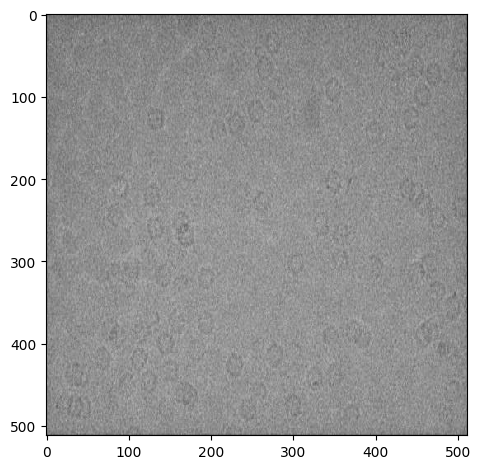

In [16]:
imshow(X_train[8])
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

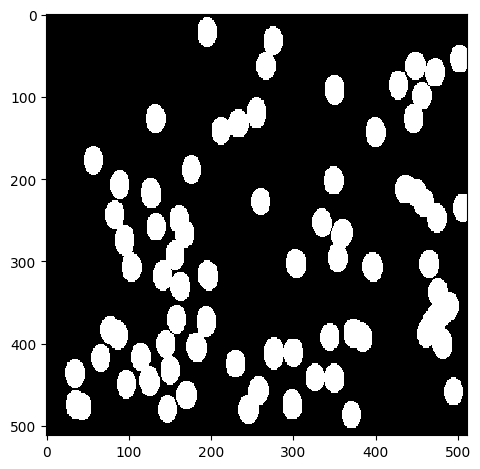

In [ ]:
imshow(Y_train[8])
plt.show

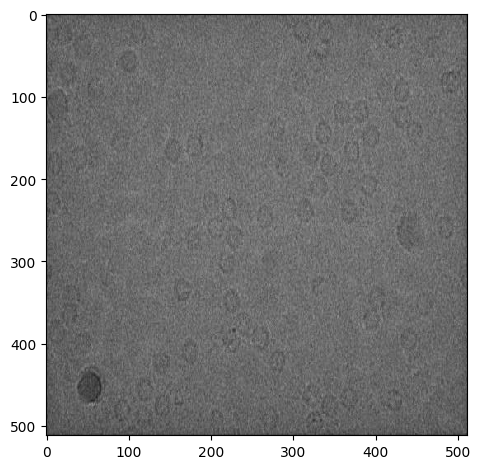

In [ ]:
imshow(X_test[5])

# Build the UNET for segmentation

In [17]:
# Set random seed for TensorFlow
tf.random.set_seed(0)

#Build the model
inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)

#Contraction path
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
c1 = tf.keras.layers.Dropout(0.1)(c1)
c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = tf.keras.layers.Dropout(0.1)(c2)
c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = tf.keras.layers.Dropout(0.2)(c3)
c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = tf.keras.layers.Dropout(0.2)(c4)
c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)

c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
c5 = tf.keras.layers.Dropout(0.3)(c5)
c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

#Expansive path
u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = tf.keras.layers.concatenate([u6, c4])
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
c6 = tf.keras.layers.Dropout(0.2)(c6)
c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
u7 = tf.keras.layers.concatenate([u7, c3])
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
c7 = tf.keras.layers.Dropout(0.2)(c7)
c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
u8 = tf.keras.layers.concatenate([u8, c2])
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
c8 = tf.keras.layers.Dropout(0.1)(c8)
c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
c9 = tf.keras.layers.Dropout(0.1)(c9)
c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)

# Compile and train the model using trained hyperparameters

The hyperparameters used here were found after a significant amount of tuning which is not shown to keep the notebook as concise as possible

In [18]:
learning_rate = 0.001
weight_decay = 0.0005
optimizer_string = 'Adam'
batch_size = 16
epochs=100

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate, weight_decay=weight_decay)
model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [24]:
history = model.fit(X_train, Y_train, batch_size=batch_size, epochs=epochs)

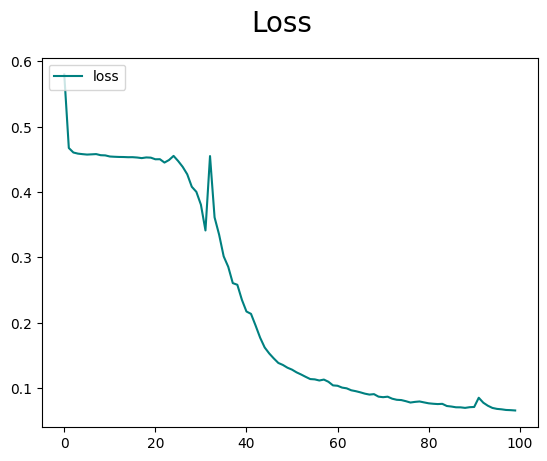

In [ ]:
fig = plt.figure()
plt.plot(history.history['loss'], color='teal', label='loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()

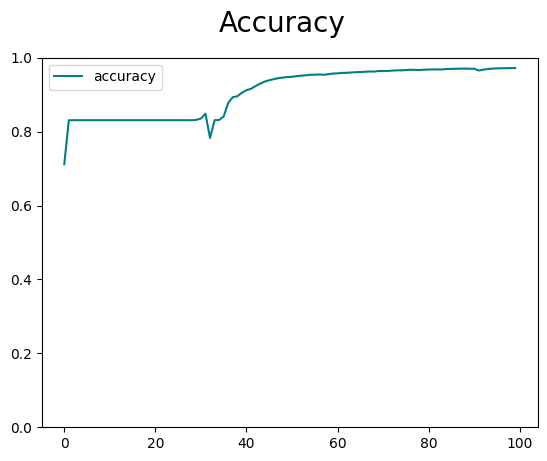

In [ ]:
fig = plt.figure()
plt.plot(history.history['accuracy'], color='teal', label='accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.ylim([0, 1])
plt.legend(loc="upper left")
plt.show()

# Run test images through the UNET and display results

In [22]:
preds_test = model.predict(X_test, verbose=1)

1/1 [==============================] - 4s 4s/step


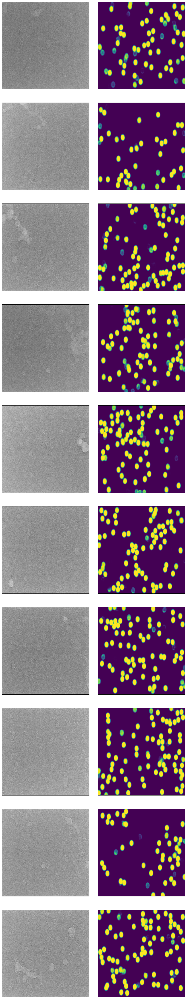

In [23]:
fig, ax = plt.subplots(nrows=10, ncols=2, figsize=(10,60))
plt.subplots_adjust(left=0.01, right=0.99, top=0.9, bottom=0.01, wspace=0.1, hspace=0.1)


ax[0, 0].imshow(X_test[0]*255)
ax[0, 1].imshow(preds_test[0]*255)

ax[1, 0].imshow(X_test[1]*255)
ax[1, 1].imshow(preds_test[1]*255)

ax[2, 0].imshow(X_test[2]*255)
ax[2, 1].imshow(preds_test[2]*255)

ax[3, 0].imshow(X_test[3]*255)
ax[3, 1].imshow(preds_test[3]*255)

ax[4, 0].imshow(X_test[4]*255)
ax[4, 1].imshow(preds_test[4]*255)

ax[5, 0].imshow(X_test[5]*255)
ax[5, 1].imshow(preds_test[5]*255)

ax[6, 0].imshow(X_test[6]*255)
ax[6, 1].imshow(preds_test[6]*255)

ax[7, 0].imshow(X_test[7]*255)
ax[7, 1].imshow(preds_test[7]*255)

ax[8, 0].imshow(X_test[8]*255)
ax[8, 1].imshow(preds_test[8]*255)

ax[9, 0].imshow(X_test[9]*255)
ax[9, 1].imshow(preds_test[9]*255)


for row in range(10):
    for col in range(2):
        # Remove x-axis and y-axis ticks
        ax[row, col].set_xticks([])
        ax[row, col].set_yticks([])

        # Remove x-axis and y-axis tick labels
        ax[row, col].set_xticklabels([])
        ax[row, col].set_yticklabels([])

# Object Detection

# Import training and test data for object detection

The training data is the segmented testing data from the previous section in which segmented apoferretin protein complexes have been labelled. The test data is a new set of segmented images

In [ ]:
!cp -r /content/drive/MyDrive/segment_and_object_detect_apo/apo_object_detect .

#Install Ultralytics to use yoloV8 model

In [ ]:
!pip install ultralytics

In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.184 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.4/78.2 GB disk)


# Visualising data

Apoferritin proteins can be seen as circular objects in the image below

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

In [ ]:
image_path = '/content/apo_object_detect/images/train/img3.jpg'
image = mpimg.imread(image_path)

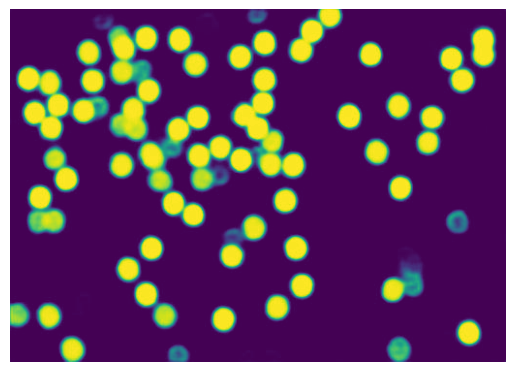

In [ ]:
plt.imshow(image)
plt.axis('off')
plt.show()

# Importing modules for model initalisation and hyperparameter tuning

In [ ]:
import pandas as pd
from ultralytics import YOLO
from sklearn.model_selection import ParameterSampler
from sklearn.model_selection import ParameterGrid

# Intialising model and performing rough randomised hyperparameter tuning

In [ ]:
results = [['learning_rate', 'batch_size', 'optimizer', 'weight_decay', 'iou', 'mAP50', 'mAP75']]

param_grid = {
            'learning_rate':[0.001, 0.005, 0.01],
            'batch_size':[32, 64],
            'optimizer':['SGD', 'Adamax', 'RAdam'],
            'weight_decay':[0.0001, 0.001],
            'iou':[0.2, 0.3]
}

grid = ParameterSampler(param_grid,n_iter=20)


for parameters in grid:
    learning_rate = parameters['learning_rate']
    batch_size = parameters['batch_size']
    optimizer = parameters['optimizer']
    weight_decay = parameters['weight_decay']
    iou = parameters['iou']

    model = YOLO('yolov8m.pt')
    model.train(data='dataset.yaml', epochs=200, batch=batch_size,  imgsz=640, optimizer=optimizer, cos_lr=True, lr0=learning_rate, weight_decay=weight_decay, iou=iou, patience=30)
    metrics = model.val()
    results.append([learning_rate, batch_size, optimizer, weight_decay, iou, metrics.box.map50, metrics.box.map75])
    model.predict('/content/apo_object_detect/images/train/img3.jpg', save =True, save_txt = True, show_labels=False)

# Showing parameters in addition to associated mAP50 and	mAP75 metrics from hyperparameter tuning

In [ ]:
df = pd.DataFrame(results[1:], columns=results[0])

In [ ]:
df_sorted = df.sort_values(by=['mAP50', 'mAP75'], ascending=[False, False])

In [ ]:
df_sorted.head(20)

,learning_rate,batch_size,optimizer,weight_decay,iou,mAP50,mAP75
9,0.005,64,SGD,0.0010,0.3,0.995000,0.978216
7,0.001,32,Adamax,0.0010,0.3,0.995000,0.976579
10,0.010,32,RAdam,0.0001,0.3,0.995000,0.966834
19,0.005,32,SGD,0.0001,0.3,0.995000,0.966394
5,0.010,64,RAdam,0.0001,0.3,0.995000,0.950072
18,0.001,32,RAdam,0.0010,0.3,0.994942,0.978271
14,0.010,16,RAdam,0.0010,0.3,0.994941,0.982749
13,0.005,16,Adamax,0.0010,0.3,0.994941,0.966478
3,0.001,16,Adamax,0.0010,0.3,0.994884,0.970999
12,0.005,64,RAdam,0.0010,0.3,0.994883,0.967199


# Performing fine hyperparameter tuning using grid based approach

In [ ]:
results_grid = [['learning_rate', 'batch_size', 'optimizer', 'weight_decay', 'iou', 'mAP50', 'mAP75']]

param_grid = {
            'learning_rate':[0.005,0.001],
            'batch_size':[32],
            'optimizer':['SGD', 'Adamax', 'RAdam'],
            'weight_decay':[0.001, 0.005],
            'iou':[0.3]
}


grid = ParameterGrid(param_grid)


for parameters in grid:
    learning_rate = parameters['learning_rate']
    batch_size = parameters['batch_size']
    optimizer = parameters['optimizer']
    weight_decay = parameters['weight_decay']
    iou = parameters['iou']

    model = YOLO('yolov8m.pt')
    model.train(data='dataset.yaml', epochs=200, batch=batch_size,  imgsz=640, optimizer=optimizer, cos_lr=True, lr0=learning_rate, weight_decay=weight_decay, iou=iou, patience=30)
    metrics = model.val()
    results_grid.append([learning_rate, batch_size, optimizer, weight_decay, iou, metrics.box.map50, metrics.box.map75])
    model.predict('/content/yolo_data_segmentation_100/images/test/img0.jpg', save =True, save_txt = True, show_labels=False)

# Displaying results from fine hyperparameter tuning

In [ ]:
df_grid = pd.DataFrame(results_grid[1:], columns=results_grid[0])

In [ ]:
df_grid_sorted = df_grid.sort_values(by=['mAP50', 'mAP75'], ascending=[False, False])
df_grid_sorted.head(20)

,learning_rate,batch_size,optimizer,weight_decay,iou,mAP50,mAP75
5,0.005,32,RAdam,0.005,0.3,0.995000,0.978261
8,0.001,32,Adamax,0.001,0.3,0.995000,0.976579
1,0.005,32,SGD,0.005,0.3,0.995000,0.958930
10,0.001,32,RAdam,0.001,0.3,0.994942,0.978271
9,0.001,32,Adamax,0.005,0.3,0.994941,0.980886
4,0.005,32,RAdam,0.001,0.3,0.994941,0.980377
11,0.001,32,RAdam,0.005,0.3,0.994882,0.981378
0,0.005,32,SGD,0.001,0.3,0.994882,0.955611
6,0.001,32,SGD,0.001,0.3,0.989985,0.943407
2,0.005,32,Adamax,0.001,0.3,0.988384,0.934703


# Performing more hyperparameter tuning using grid based approach

In [ ]:
results_grid = [['learning_rate', 'batch_size', 'optimizer', 'weight_decay', 'iou', 'mAP50', 'mAP75']]

param_grid = {
            'learning_rate':[0.001],
            'batch_size':[32,128],
            'optimizer':['RAdam'],
            'weight_decay':[0.005],
            'iou':[0.2,0.3,0.4]
}

grid = ParameterGrid(param_grid)


for parameters in grid:
    learning_rate = parameters['learning_rate']
    batch_size = parameters['batch_size']
    optimizer = parameters['optimizer']
    weight_decay = parameters['weight_decay']
    iou = parameters['iou']

    model = YOLO('yolov8m.pt')
    model.train(data='dataset.yaml', epochs=200, batch=batch_size,  imgsz=640, optimizer=optimizer, cos_lr=True, lr0=learning_rate, weight_decay=weight_decay, iou=iou, patience=30)
    metrics = model.val()
    results_grid.append([learning_rate, batch_size, optimizer, weight_decay, iou, metrics.box.map50, metrics.box.map75])
    model.predict('/content/yolo_data_segmentation_100/images/test/img0.jpg', save =True, save_txt = True, show_labels=False)

In [ ]:
df_grid = pd.DataFrame(results_grid[1:], columns=results_grid[0])

In [ ]:
df_grid_sorted = df_grid.sort_values(by=['mAP50', 'mAP75'], ascending=[False, False])
df_grid_sorted.head(20)

,learning_rate,batch_size,optimizer,weight_decay,iou,mAP50,mAP75
4,0.001,128,RAdam,0.005,0.3,0.995000,0.984065
5,0.001,128,RAdam,0.005,0.4,0.995000,0.983524
1,0.001,32,RAdam,0.005,0.3,0.994882,0.981378
2,0.001,32,RAdam,0.005,0.4,0.994882,0.980357
3,0.001,128,RAdam,0.005,0.2,0.992045,0.969990
0,0.001,32,RAdam,0.005,0.2,0.991199,0.974658


# Train model with best hyperparameters

In [ ]:
best_model = YOLO('yolov8m.pt')
best_model.train(data='/content/apo_object_detect/dataset.yaml', epochs=200, batch=64,  imgsz=640, optimizer='RAdam', cos_lr=True, lr0=0.001, weight_decay=0.005, iou=0.3)

# Tuned model validation

In [ ]:
metrics = best_model.val()

Ultralytics YOLOv8.0.184 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients
val: Scanning /content/apo_object_detect/labels/val.cache... 2 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2/2 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]
                   all          2        170      0.988          1      0.995      0.839
Speed: 0.3ms preprocess, 62.0ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/val


In [ ]:
print(f'mAP50: {metrics.box.map50}')
print(f'mAP75: {metrics.box.map75}')

mAP50: 0.9949411764705883
mAP75: 0.9778067046897654


# Running model on test data

In [ ]:
import os

def get_file_list(directory):
    file_list = []
    for root, dirs, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            file_list.append(file_path)
    return sorted(file_list)

directory_path = '/content/apo_object_detect/images/test/segmented'

files = get_file_list(directory_path)

for file in files:
  best_model.predict(file, save =True, save_txt = True, line_width=1, show_labels=False, conf=0.4, iou=0.7)


# Visualising the results from the object detection on the test data

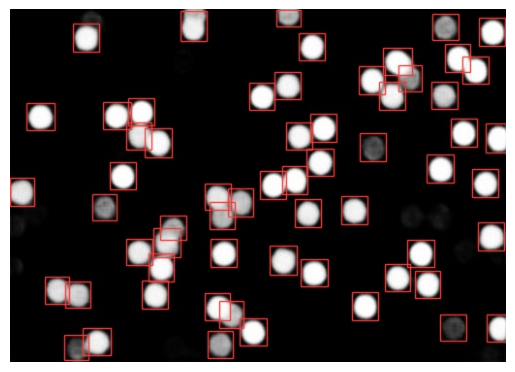

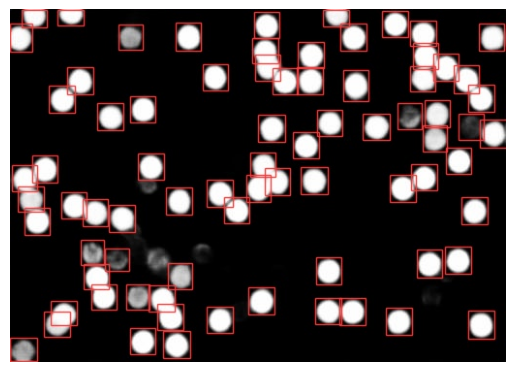

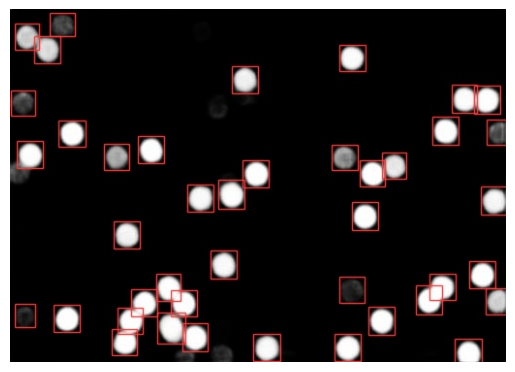

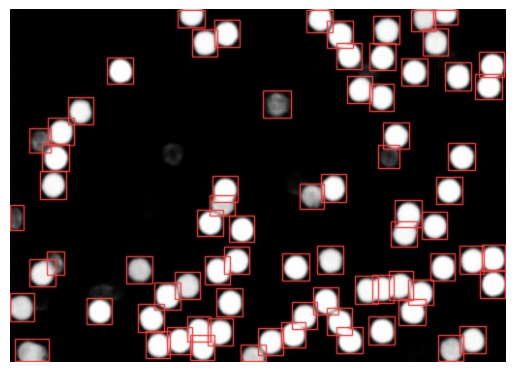

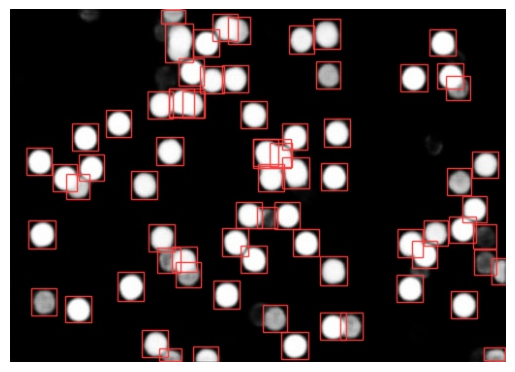

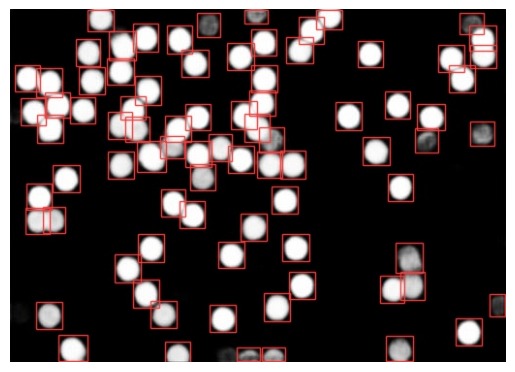

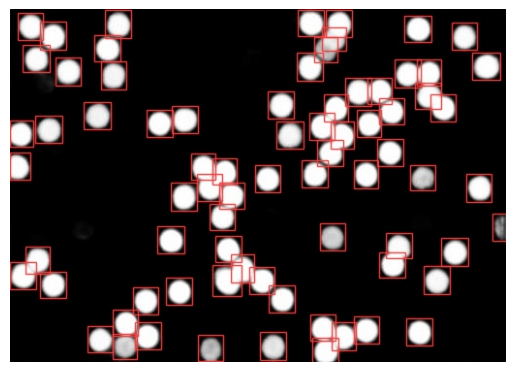

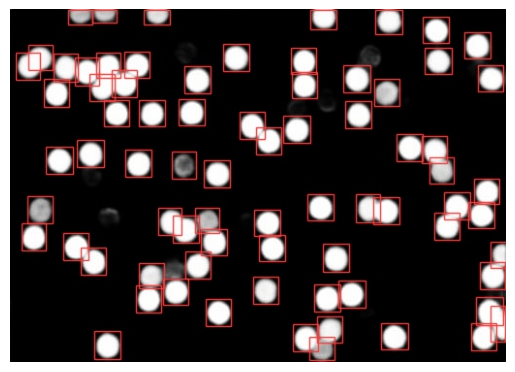

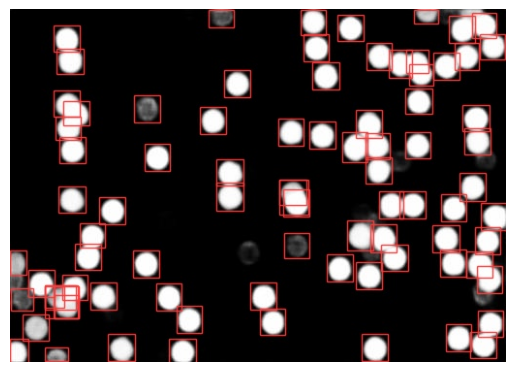

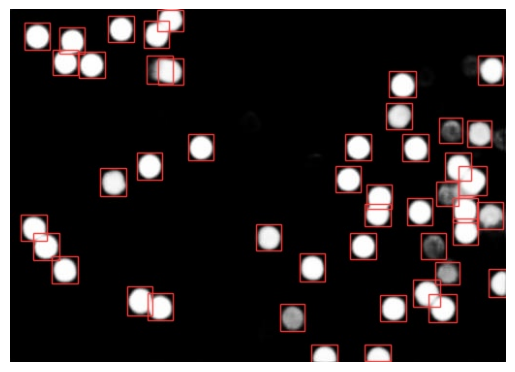

In [ ]:
import glob

directory_path = '/content/runs/detect/predict*'
segmented_file_paths = []

directories = glob.glob(directory_path)

for directory in directories:
    jpeg_files = glob.glob(directory + '/*.jpg')
    segmented_file_paths.extend(jpeg_files)

segmented_file_paths = sorted(segmented_file_paths)

for file_path in segmented_file_paths:
  image = mpimg.imread(file_path)
  plt.imshow(image)
  plt.axis('off')
  plt.show()

# Comparison with unsegmented object detection

Here I use an object detetion model trained on unsegmented data to dectect apoferritin protein complexes in the test data before it is segmented by the UNET I built and trained. I then compare the results of object detection in the the segmented and unsegmented data

In [ ]:
unsegmented_model = YOLO('/content/apo_object_detect/apoferritin_detecter.pt')

In [ ]:
import os

def get_file_list(directory):
    file_list = []
    for root, dirs, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            file_list.append(file_path)
    return sorted(file_list)

directory_path = '/content/apo_object_detect/images/test/original'

files = get_file_list(directory_path)

for file in files:
  unsegmented_model.predict(file, save =True, save_txt = True, line_width=1, show_labels=False, conf=0.4, iou=0.7)

In [ ]:
import glob

directory_path = '/content/runs/detect/predict11'
unsegmented_file_paths = []

directories = glob.glob(directory_path)

for directory in directories:
    jpeg_files = glob.glob(directory + '/*.jpg')
    unsegmented_file_paths.extend(jpeg_files)

unsegmented_file_paths = sorted(unsegmented_file_paths)


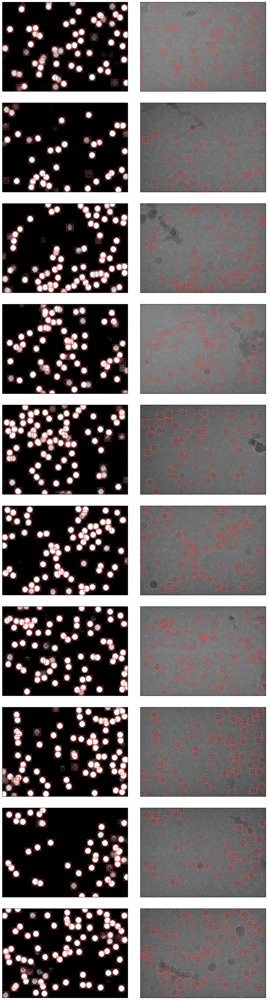

In [ ]:
from PIL import Image

segmented_images = [Image.open(path) for path in segmented_file_paths]
unsegmented_images = [Image.open(path) for path in unsegmented_file_paths]

fig, ax = plt.subplots(nrows=10, ncols=2, figsize=(12,50))
plt.subplots_adjust(left=0.01, right=0.99, top=0.9, bottom=0.01, wspace=0.1, hspace=0.1)

ax[0, 0].imshow(segmented_images[0])
ax[0, 1].imshow(unsegmented_images[0])

ax[1, 0].imshow(segmented_images[2])
ax[1, 1].imshow(unsegmented_images[1])

ax[2, 0].imshow(segmented_images[3])
ax[2, 1].imshow(unsegmented_images[2])

ax[3, 0].imshow(segmented_images[4])
ax[3, 1].imshow(unsegmented_images[3])

ax[4, 0].imshow(segmented_images[5])
ax[4, 1].imshow(unsegmented_images[4])

ax[5, 0].imshow(segmented_images[6])
ax[5, 1].imshow(unsegmented_images[5])

ax[6, 0].imshow(segmented_images[7])
ax[6, 1].imshow(unsegmented_images[6])

ax[7, 0].imshow(segmented_images[8])
ax[7, 1].imshow(unsegmented_images[7])

ax[8, 0].imshow(segmented_images[9])
ax[8, 1].imshow(unsegmented_images[8])

ax[9, 0].imshow(segmented_images[1])
ax[9, 1].imshow(unsegmented_images[9])


for row in range(10):
    for col in range(2):
        # Remove x-axis and y-axis ticks
        ax[row, col].set_xticks([])
        ax[row, col].set_yticks([])

        # Remove x-axis and y-axis tick labels
        ax[row, col].set_xticklabels([])
        ax[row, col].set_yticklabels([])